So in analyzing the SARFI script results, I wanted to look at some individual stamp files. This is the script to do that

### Setup

In [1]:
# Import packages needed
import numpy as np
import pandas as pd
import pickle
import os
os.environ["H5PY_DEFAULT_READONLY"] = "1" # Surpress h5py deprecation warnings
import socket
from datetime import datetime
from seticore import viewer # If you don't have it, use pip install "git+https://github.com/MydonSolutions/seticore#egg=seticore&subdirectory=python"
import matplotlib.pyplot as plt

kj/filesystem-disk-unix.c++:1703: warning: PWD environment variable doesn't match current directory; pwd = /home/nstiegle


In [2]:
# Load in data
data_dir = "/mnt/cosmic-gpu-1/data0/nstiegle/representative_samples/"
filename = "1in25_targets.csv"
data_file = data_dir + filename
df = pd.read_csv(data_file)
print(df.shape)

(1248312, 30)


In [3]:
# Look for the stamp in a single stamp file
# Assumes the stamp_uri exists 
def find_stamp_in_single_file(stamp_uri, hit_frequency, threshold):
    # Check each stamp in the file to see if it matches
    stamps_gen = viewer.read_stamps(stamp_uri, find_recipe=True)
    for i, stamp in enumerate(stamps_gen):
        assert(stamp != None)
        assert(stamp.recipe != None)
        if abs(stamp.stamp.signal.frequency - hit_frequency) < threshold*1e-6:
            # Found the stamp!
            return i, stamp
    
    # Didn't find the stamp in this whole file of stamps
    return None, None

# Given a stamp_uri, increments the index of the stamp file by one (so if it's /.../...seticore.0000.stamps it goes to /.../...seticore.0001.stamps)
def increment_stamp_uri(stamp_uri):
    split_uri = stamp_uri.split('.')
    assert(split_uri[-1] == 'stamps')
    num = int(split_uri[-2])
    num += 1
    split_uri[-2] = str(num).zfill(4)
    return ".".join(split_uri)

# Finds where the stamp of a given hit is
# Takes:
# - stamp URI (of stamp file)
# - the frequency the hit occurred at
# - The width of the stamp file (distance in Hz from center of stamp file to hit_frequency to call hit in stamp file)
# Returns stamp_uri, index_in_stamp_file if found, otherwise None, None
def find_stamp_location_helper(stamp_uri, hit_frequency, threshold):
    # Check stamp file passed in exists
    if not os.path.exists(stamp_uri):
        return None, None
    
    # Look for stamp in the stamp file given
    index, stamp = find_stamp_in_single_file(stamp_uri, hit_frequency, threshold)
    if (index != None) and (stamp != None):
        return stamp_uri, index
    else:
        # Check if there's another stamp file (because stamps can get split up into multiple files)
        return find_stamp_location_helper(increment_stamp_uri(stamp_uri), hit_frequency, threshold)

# Finds where the stamp of a given hit is
# Takes:
# - hit URI (of .hits file)
# - the frequency the hit occurred at
# - The width of the stamp file (distance in Hz from center of stamp file to hit_frequency to call hit in stamp file)
# Returns stamp_uri, index_in_stamp_file if found, otherwise None, None
def find_stamp_location(hit_uri, hit_frequency, threshold=500):
    # Convert a filepath from pointing to a .hits
    # to a .stamps file for the same uri
    # If given a .stamps ending, doesn't change it
    def stamp_filepath_of(hits_filepath):
        return hits_filepath.replace('.hits', '.0000.stamps')

    return find_stamp_location_helper(stamp_filepath_of(hit_uri), hit_frequency, threshold)

### Code to look at stamp of id

In [4]:
def find_stamp_from_id(stamp_id):
    # Find the stamp we want
    row = df[df.id == stamp_id]
    stamp_uri, index_in_stamp = find_stamp_location(row.file_uri.values[0], row.signal_frequency.values[0])
    print(stamp_uri)
    print("Index in stamp:", index_in_stamp)
    stamps = [stamp for stamp in viewer.read_stamps(stamp_uri, find_recipe=True)]
    stamp = stamps[index_in_stamp]
    assert(stamp != None)
    assert(stamp.recipe != None)
    return stamp

### Look at stamps

So I found a stamp with an SNR of 12 which looks kind of interesting. There are 4 antennas with a signal:

 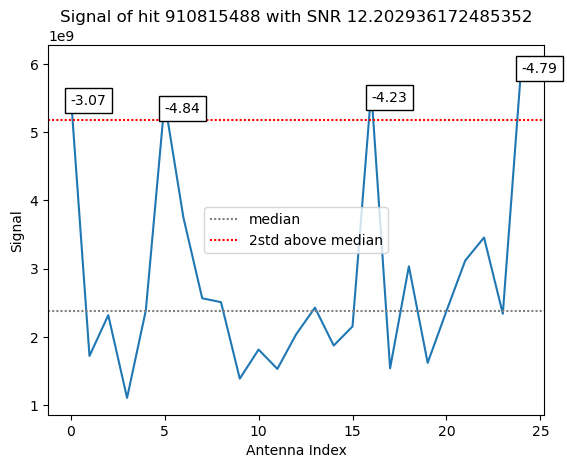

/mnt/cosmic-storage-2/data2/vla_target/23B-169.sb44841384.eb44866281.60283.982011817134/23B-169.sb44841384.eb44866281.60283.982011817134.40.1/23B-169.sb44841384.eb44866281.60283.982011817134.40.1.AC.C608.0021.raw.seticore.0016.stamps
Index in stamp: 87


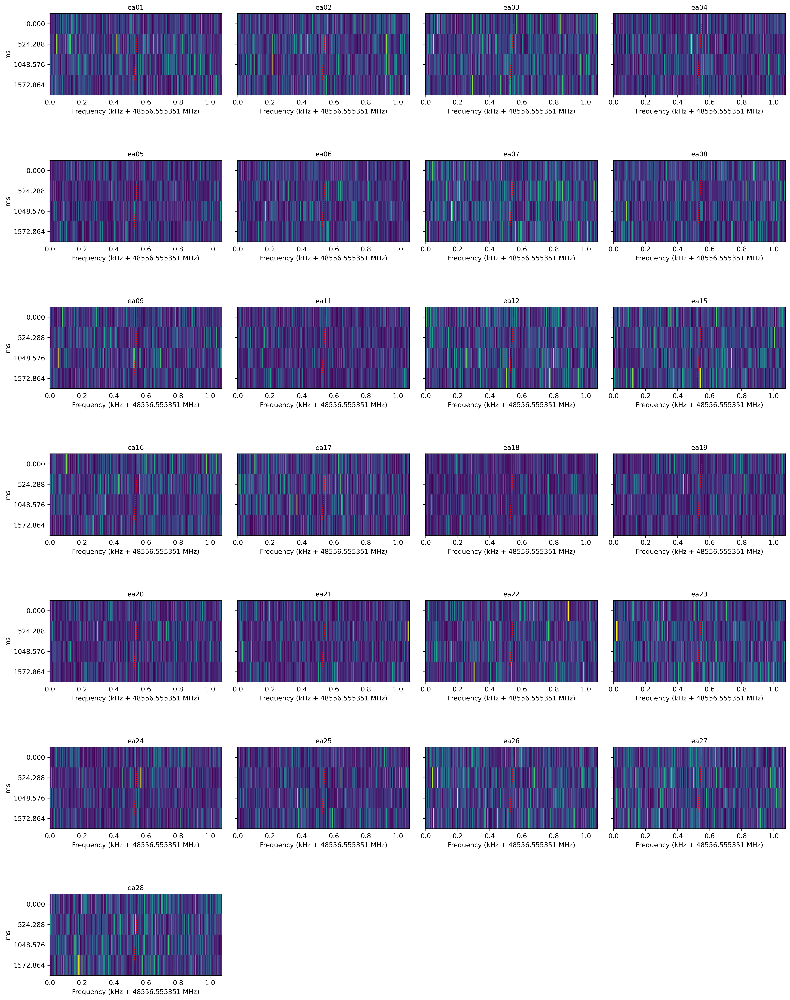

recalculated power: 2.528256e+11
local SNR: -1.4608460831731893


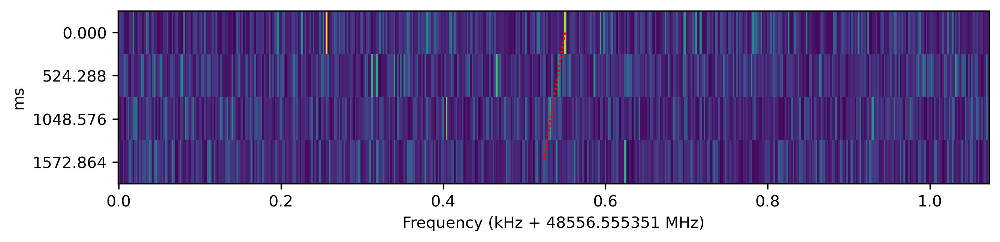

In [6]:
stamp_id = 910815488
stamp = find_stamp_from_id(stamp_id)
stamp.show_antennas(show_signal=True)
stamp.show_beam(0, show_signal=True)

I also found this signal which looks interesting:

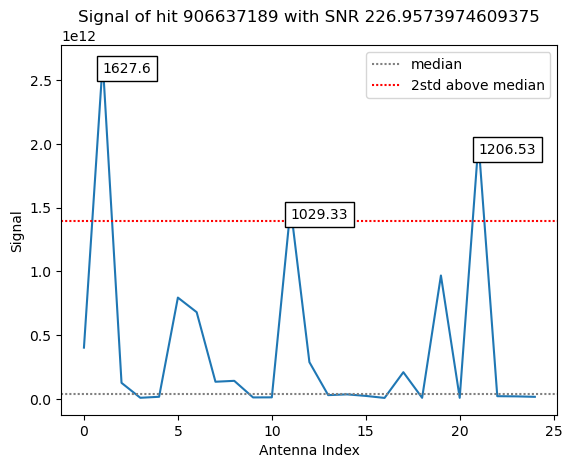

DR: -0.0 SNR: 254.947998046875


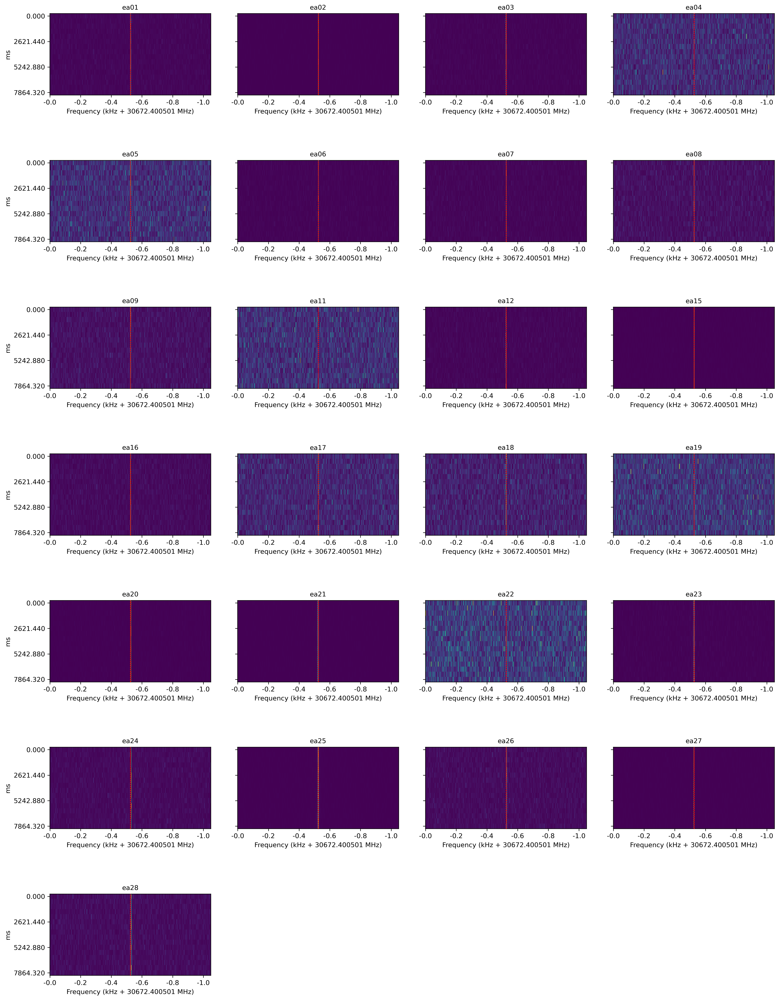

In [5]:
stamp_id = 906637189
stamp = find_stamp_from_id(stamp_id)
print(f"DR: {stamp.stamp.signal.driftRate} SNR: {stamp.stamp.signal.snr}")
stamp.show_antennas(show_signal=True)

This one has some strong SARFI but a small overall SNR

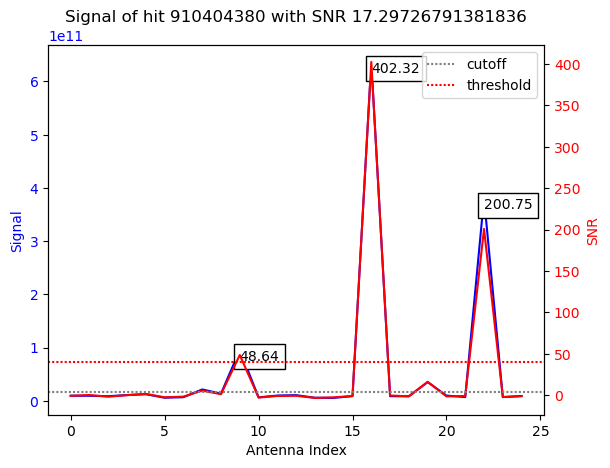

/mnt/cosmic-storage-2/data2/vla_target/23B-169.sb44841384.eb44866281.60283.982011817134/23B-169.sb44841384.eb44866281.60283.982011817134.34.1/23B-169.sb44841384.eb44866281.60283.982011817134.34.1.AC.C448.0014.raw.seticore.0000.stamps
Index in stamp: 33
DR: 0.0 SNR: 17.29726791381836


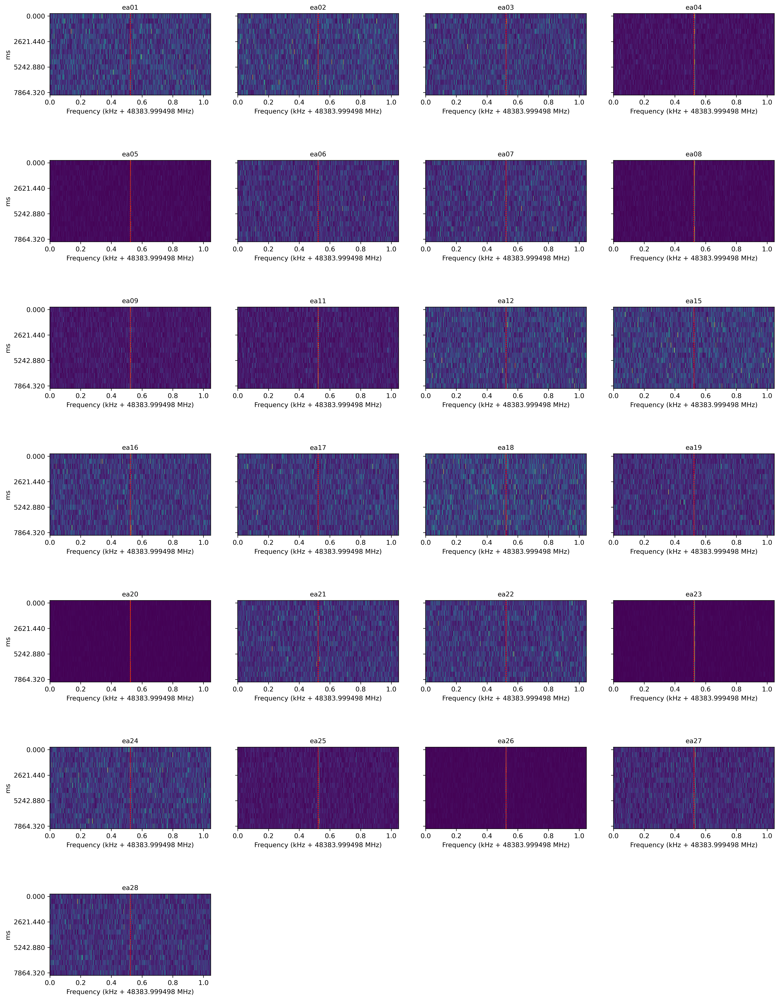

recalculated power: 1.209649e+12
local SNR: 23.827867618644405


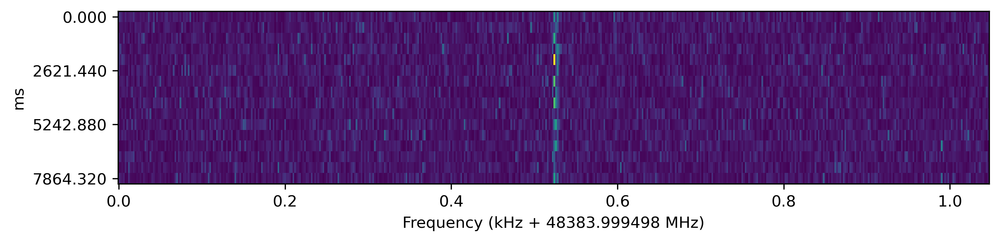

In [5]:
stamp_id = 910404380
stamp = find_stamp_from_id(stamp_id)
print(f"DR: {stamp.stamp.signal.driftRate} SNR: {stamp.stamp.signal.snr}")
stamp.show_antennas(show_signal=True)
stamp.show_beam(0)

This one has strong single antenna SARFI but others also have signals?

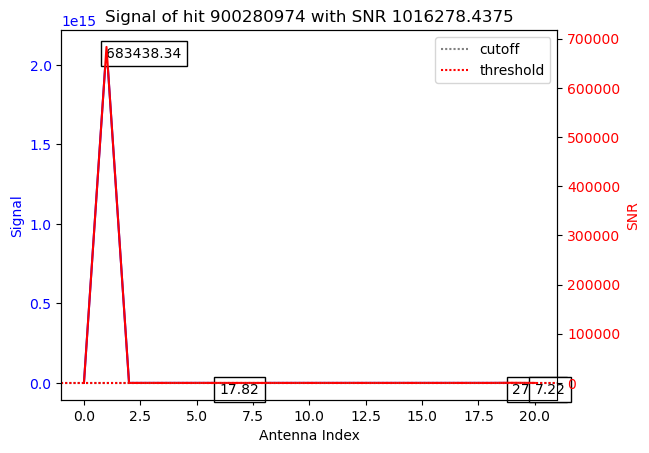

DR: 0.0 SNR: 1026293.125


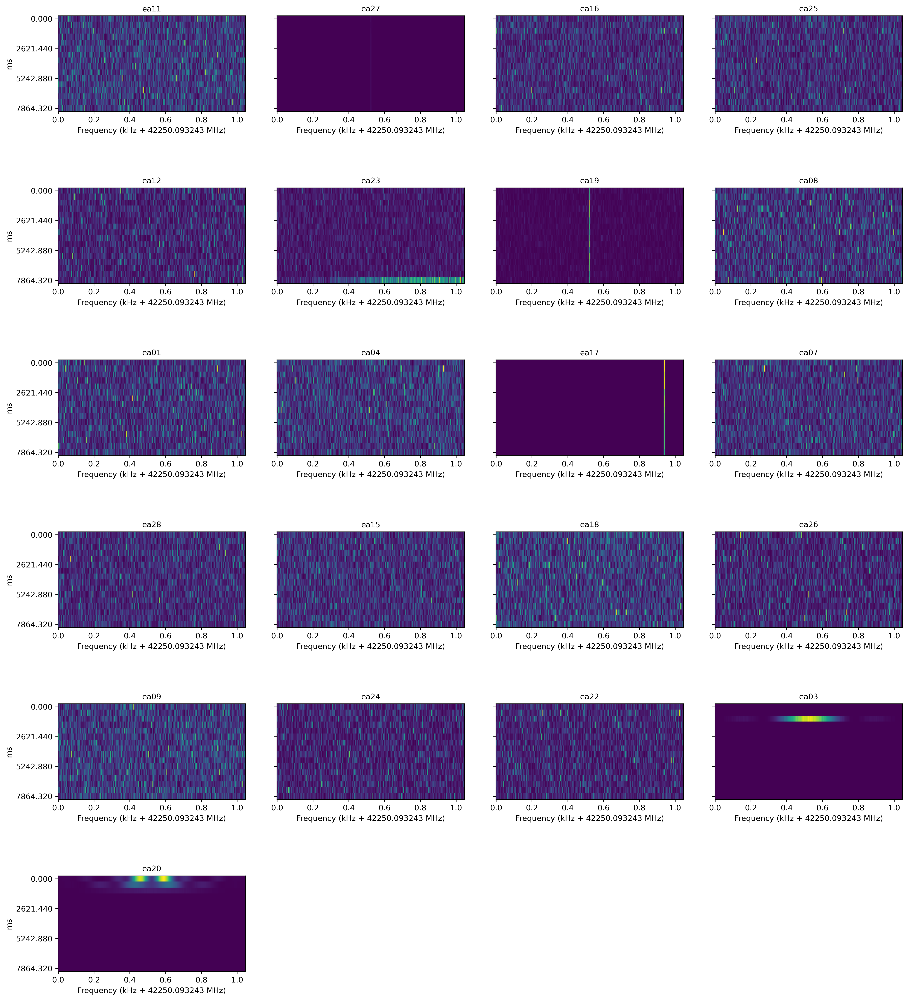

recalculated power: 2.115795e+15
local SNR: 348571.43023487355


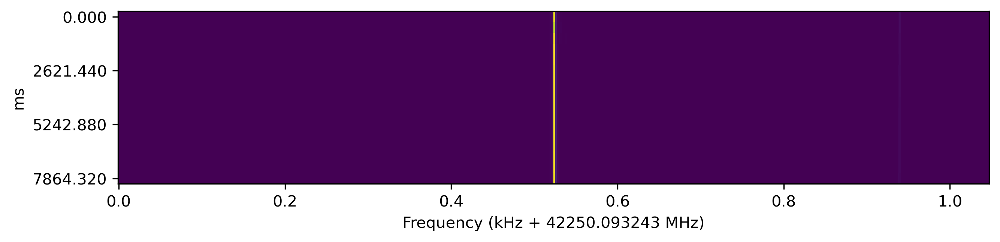

recalculated power: 2.113494e+15
local SNR: 370137.9366016379


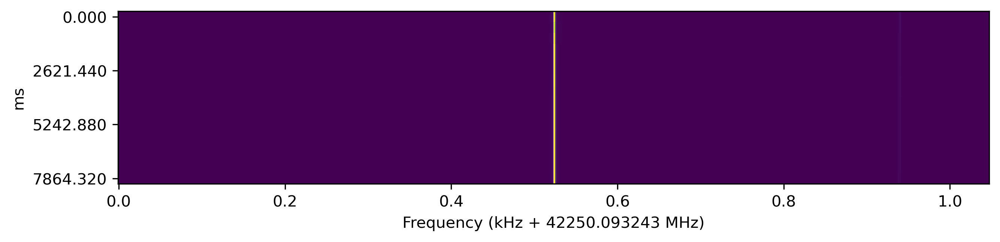

In [16]:
stamp_id = 900280974
stamp = find_stamp_from_id(stamp_id)
print(f"DR: {stamp.stamp.signal.driftRate} SNR: {stamp.stamp.signal.snr}")
stamp.show_antennas(show_signal=False)
stamp.show_beam(0, show_signal=False)
stamp.show_classic_incoherent(show_signal=False)

This one has some strong signals and also some signals which look like they were maybe cutoff by the SNR cut of 6 (on each antenna). Let's see how we did

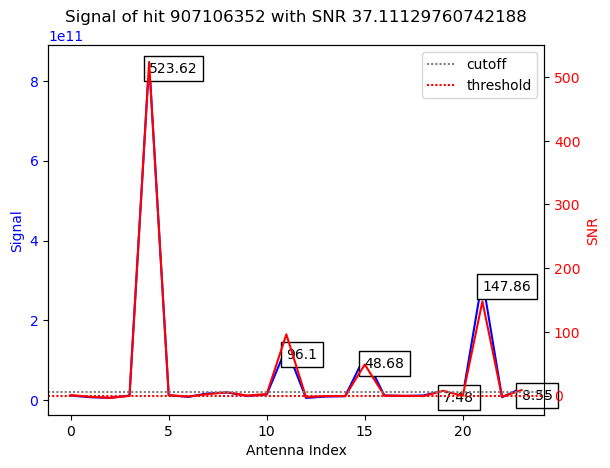

DR: 0.0 SNR: 37.111297607421875


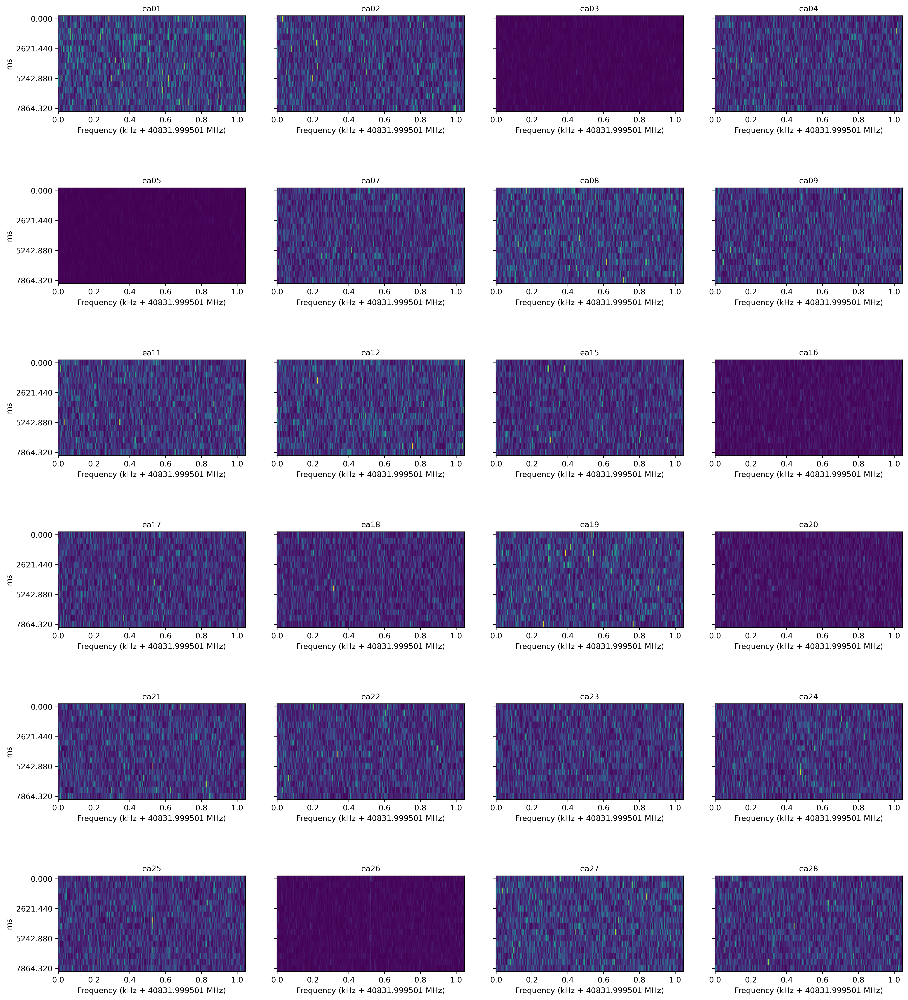

recalculated power: 1.852890e+12
local SNR: 30.87347780174418


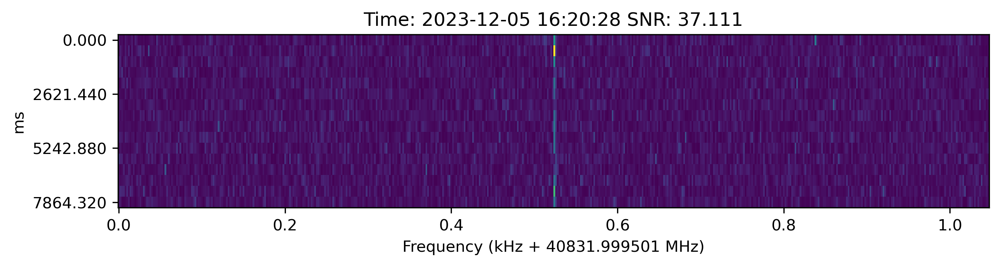

In [17]:
stamp_id = 907106352
stamp = find_stamp_from_id(stamp_id)
print(f"DR: {stamp.stamp.signal.driftRate} SNR: {stamp.stamp.signal.snr}")
stamp.show_antennas(show_signal=False)
stamp.show_beam(0, show_signal=False, title=f"Time: {datetime.fromtimestamp(int(stamp.stamp.tstart))} SNR: {round(stamp.stamp.signal.snr, 3)}")
# stamp.show_classic_incoherent(show_signal=False)

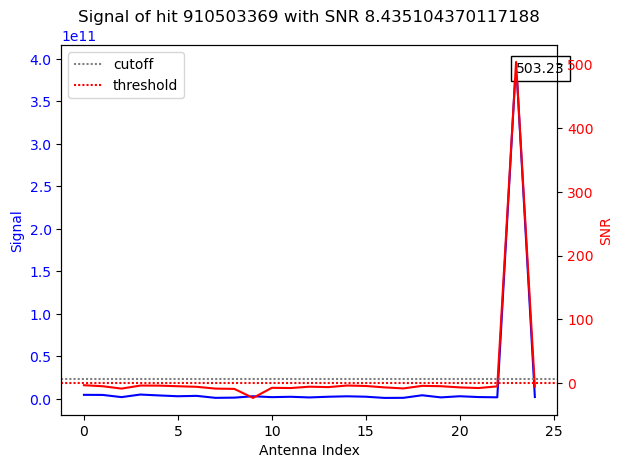

DR: 0.0 SNR: 36.09189987182617


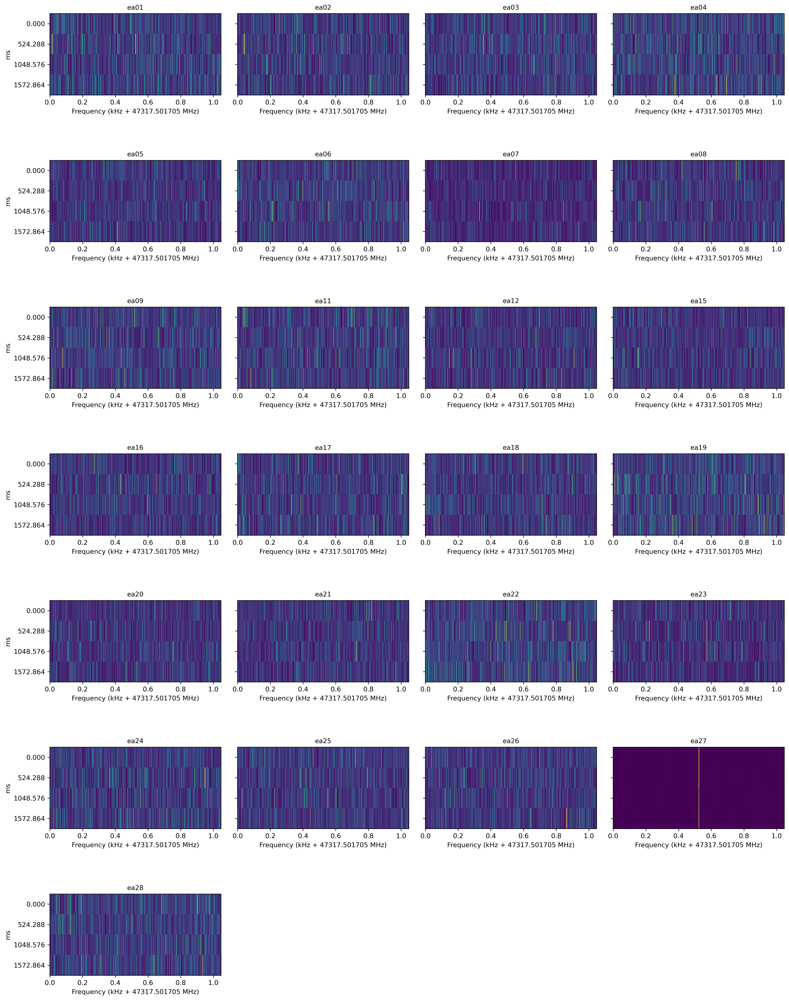

recalculated power: 3.584543e+11
local SNR: 0.6890346763400197


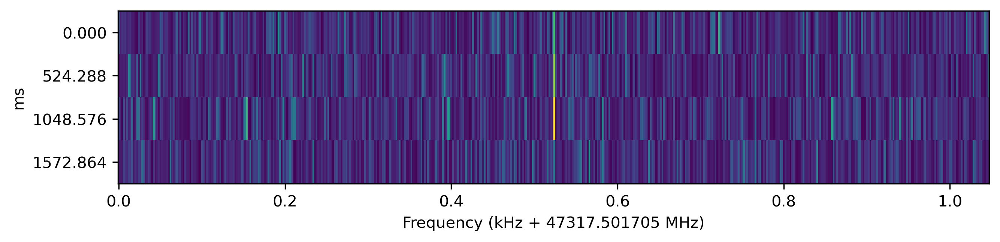

recalculated power: 4.588857e+11
local SNR: 16.57725538781499


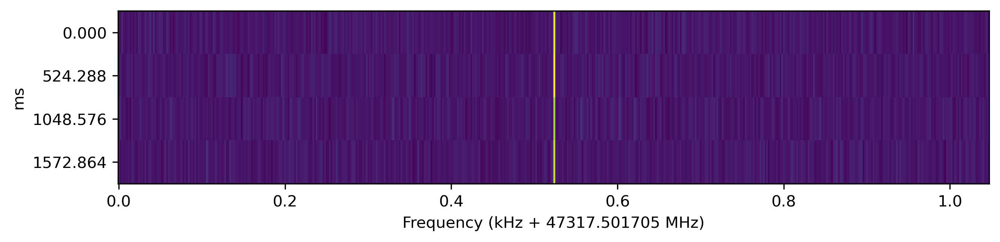

In [7]:
stamp_id = 910503369
stamp = find_stamp_from_id(stamp_id)
print(f"DR: {stamp.stamp.signal.driftRate} SNR: {stamp.stamp.signal.snr}")
stamp.show_antennas(show_signal=False)
stamp.show_beam(0, show_signal=False)
stamp.show_classic_incoherent(show_signal=False)

/mnt/cosmic-storage-2/data1/vla_target/23A-362.sb43789194.eb44583327.60212.544836180554/23A-362.sb43789194.eb44583327.60212.544836180554.101.1/23A-362.sb43789194.eb44583327.60212.544836180554.101.1.BD.C0.0000.raw.seticore.0000.stamps
Index in stamp: 302


DR: 7.033425693710646 SNR: 23.394224166870117


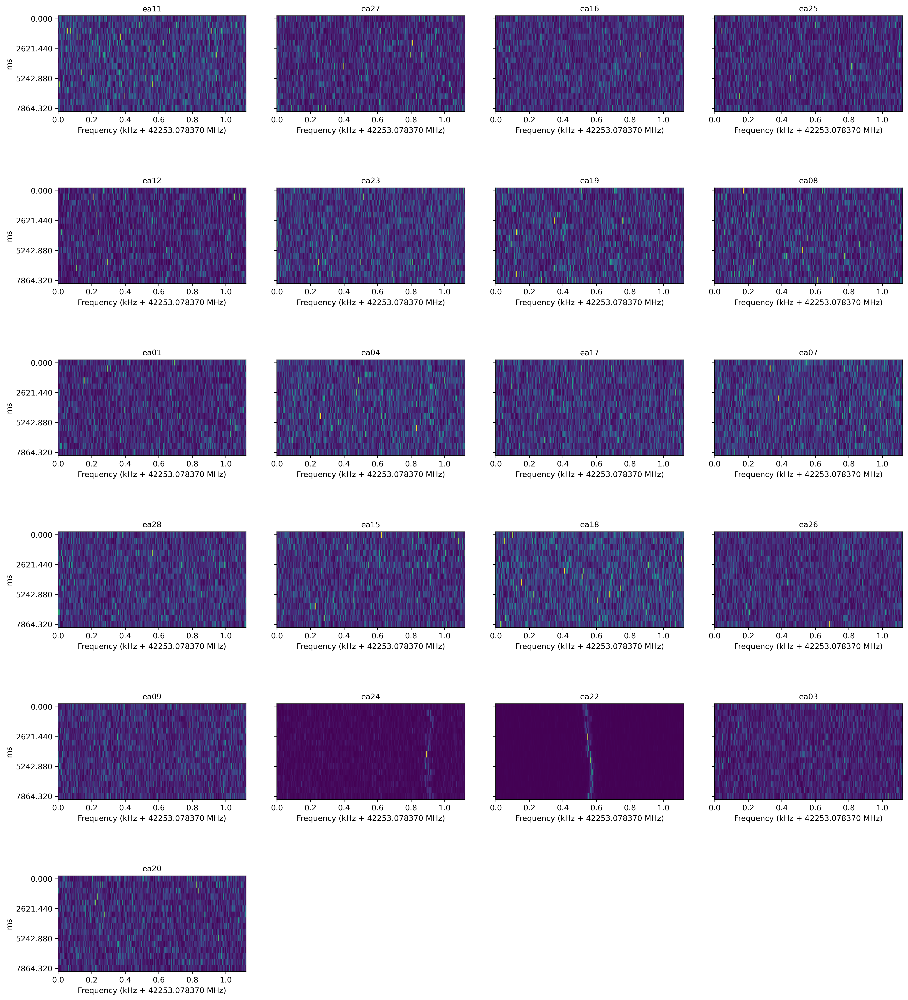

recalculated power: 1.013614e+10
local SNR: 24.96350932558595


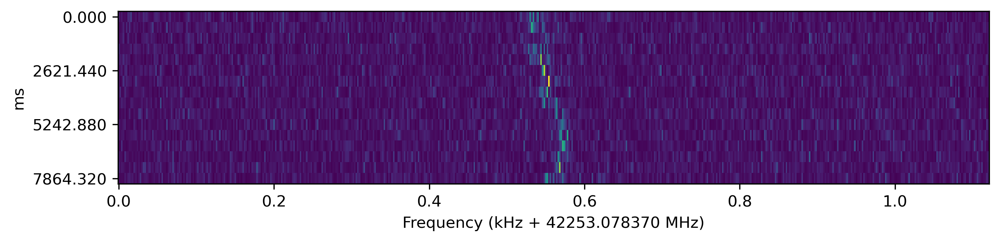

recalculated power: 9.584061e+09
local SNR: 73.50140072959933


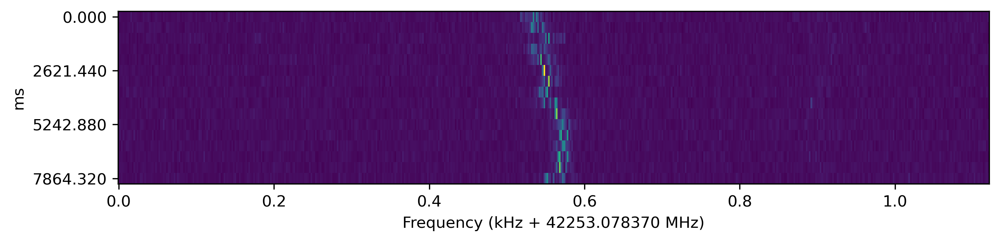

In [9]:
stamp_id = 900390572
stamp = find_stamp_from_id(stamp_id)
print(f"DR: {stamp.stamp.signal.driftRate} SNR: {stamp.stamp.signal.snr}")
stamp.show_antennas(show_signal=False)
stamp.show_beam(0, show_signal=False)
stamp.show_classic_incoherent(show_signal=False)

Looking for stamps with low snr but high antenna snr

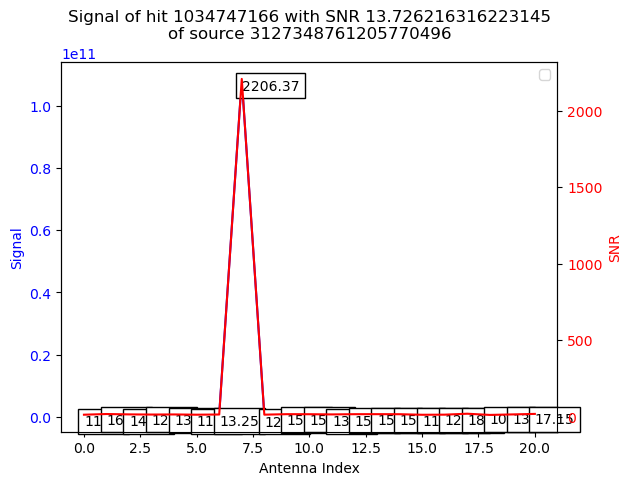
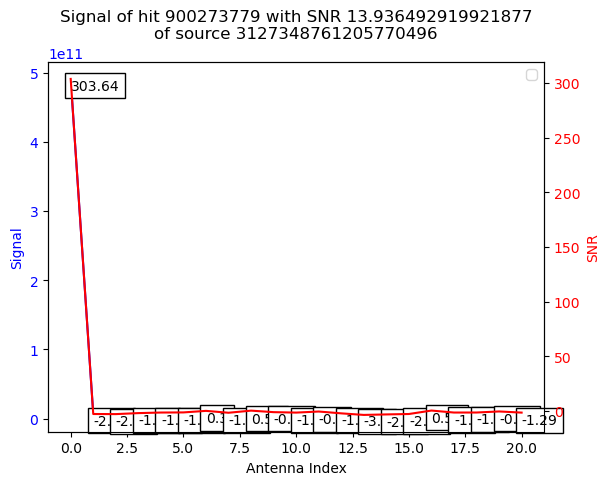
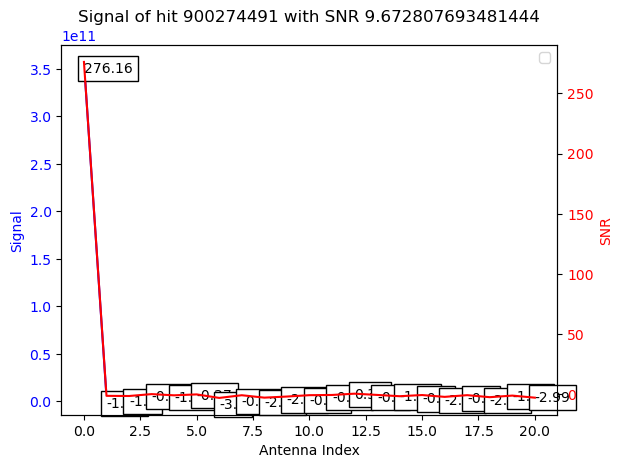

/mnt/cosmic-storage-1/data1/batch_processed/23A-362.sb43789194.eb44583327.60212.544836180554.9.1/23A-362.sb43789194.eb44583327.60212.544836180554.9.1.BD.C32.0002.raw.seticore.0000.stamps
Index in stamp: 23
DR: 0.0 SNR: 13.726216316223145


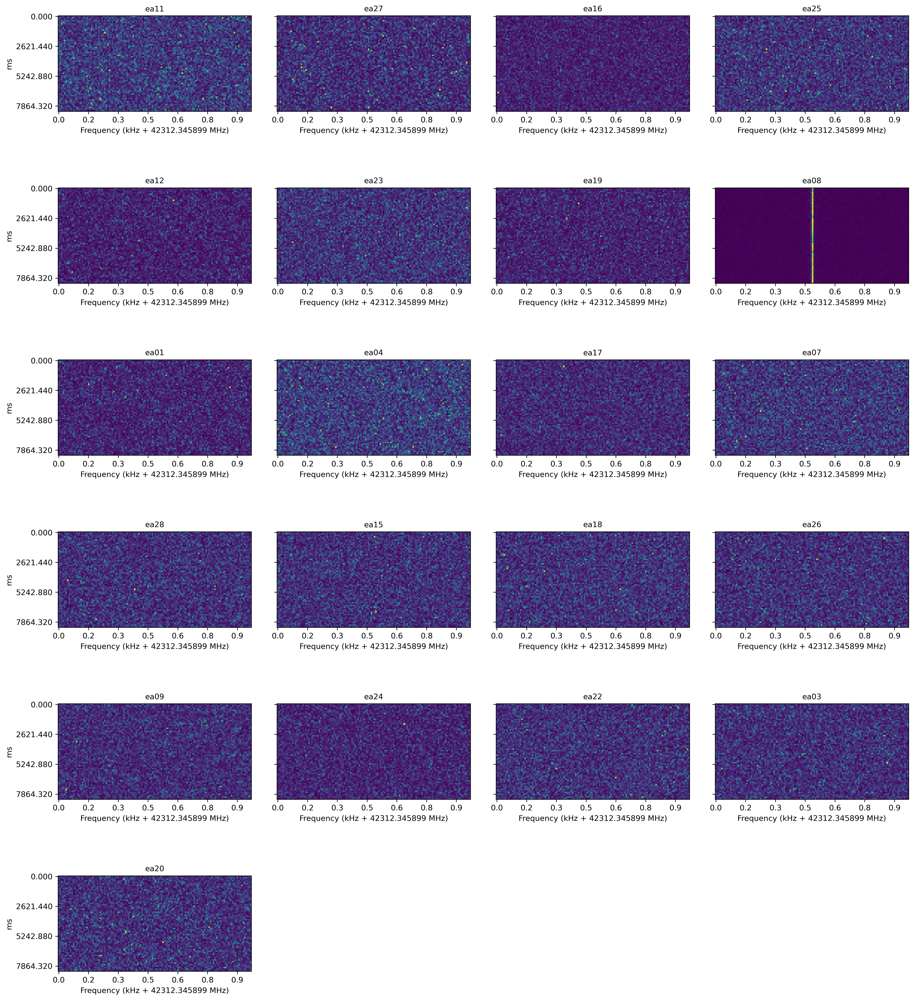

recalculated power: 1.344662e+11
local SNR: 136.62153923176504


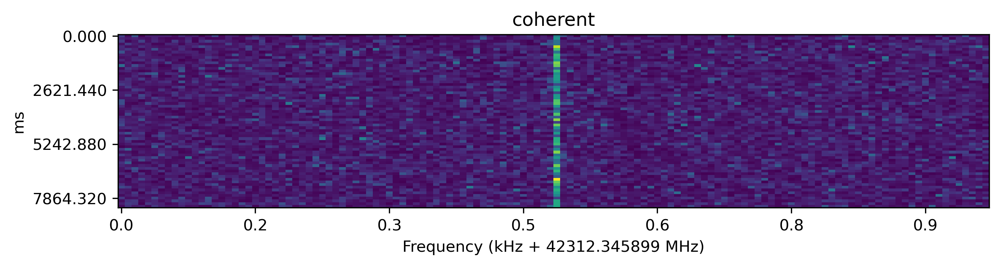

recalculated power: 1.288583e+11
local SNR: 538.6771559088994


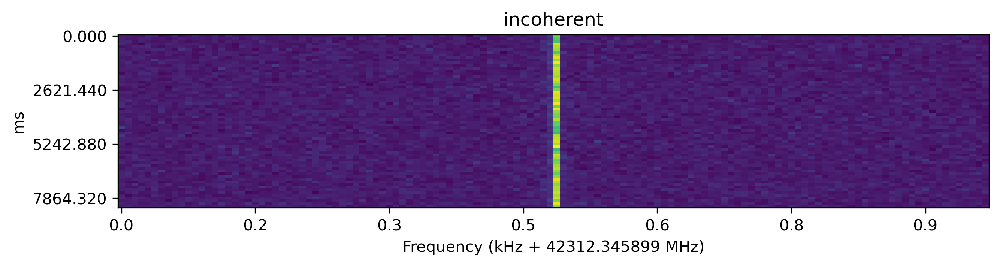

In [24]:
stamp_id = 1034747166
stamp = find_stamp_from_id(stamp_id)
print(f"DR: {stamp.stamp.signal.driftRate} SNR: {stamp.stamp.signal.snr}")
stamp.show_antennas(show_signal=False)
stamp.show_beam(0, show_signal=False, title="coherent")
stamp.show_classic_incoherent(show_signal=False, title="incoherent")